# EDA the simulation results of slurp
ggplot default setting handles the datetime poorly 
use matplotlib to do EDA

In [1]:
#load packages
import sqlite3
import re
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

In [2]:
# Build connection with db
con = sqlite3.connect('../../03processed-data/Richard.sqlite3')
mycur = con.cursor() 
mycur.execute("SELECT name FROM sqlite_master WHERE type='table' ORDER BY name;")
(mycur.fetchall())

[('ES',),
 ('Phenology',),
 ('SoilWater',),
 ('SowingDates',),
 ('biomass',),
 ('met_AshleyDene',),
 ('met_Iversen12',),
 ('root',)]

In [3]:
water = pd.read_sql('Select * from SoilWater',  con)

In [4]:
water['Clock.Today'] = pd.to_datetime(water['Clock.Today'])
water.set_index('Clock.Today', inplace=True)

In [5]:
water.columns

Index(['Experiment', 'Season', 'SowingDate', 'Rep', 'Plot', 'Seed', 'DAS',
       'SW(1)', 'SW(2)', 'SW(3)', 'SW(4)', 'SW(5)', 'SW(6)', 'SW(7)', 'SW(8)',
       'SW(9)', 'SW(10)', 'SW(11)', 'SW(12)', 'SW(13)', 'SW(14)', 'SW(15)',
       'SW(16)', 'SW(17)', 'SW(18)', 'SW(19)', 'SW(20)', 'SW(21)', 'SW(22)',
       'SW(23)', 'SWC'],
      dtype='object')

In [6]:
water_mean = water.groupby(['Experiment', 'SowingDate','Clock.Today']).mean()

In [7]:
water_mean

Rep   Plot    DAS   SW(1)   SW(2)  \
Experiment SowingDate Clock.Today                                      
AshleyDene SD1        2010-11-09   2.5  40.75   19.0  20.400  20.400   
                      2010-11-16   2.5  40.75   26.0  16.925  16.925   
                      2010-11-24   2.5  40.75   34.0  17.125  17.125   
                      2010-12-02   2.5  40.75   42.0  14.425  14.425   
                      2010-12-13   2.5  40.75   53.0  11.900  11.900   
...                                ...    ...    ...     ...     ...   
Iversen12  SD9        2012-04-21   2.5  94.50  102.0  25.400  25.400   
                      2012-05-08   2.5  94.50  119.0  20.950  20.950   
                      2012-05-24   2.5  94.50  135.0  19.300  19.300   
                      2012-06-05   2.5  94.50  147.0  25.875  25.875   
                      2012-06-21   2.5  94.50  163.0  34.150  34.150   

                                       SW(3)      SW(4)      SW(5)      SW(6)  \
Experiment SowingDate Clock.Today                                               
AshleyDene SD1        2010-11-09   16.800000  13.375000  10.987500  10.237500   
                      2010-11-16   16.800000  13.375000  10.987500  10.237500   
                      2010-11-24   17.025000  13.725000  11.050000  10.400000   
                      2010-12-02   16.575000  13.025000  10.925000  10.075000   
                      2010-12-13   13.275000  11.850000  10.900000   9.950000   
...                                      ...        ...        ...        ...   
Iversen12  SD9        2012-04-21   26.254657  22.942198  20.440130  19.109241   
                      2012-05-08   25.634125  22.564773  19.718087  18.871185   
                      2012-05-24   25.260629  22.314521  19.986812  18.433114   
                      2012-06-05   28.563366  25.290939  22.821079  20.972857   
                      2012-06-21   31.822863  28.232970  25.622723  23.485736   

                                       SW(7)  ...     SW(15)     SW(16)  \
Experiment SowingDate Clock.Today             ...                         
AshleyDene SD1        2010-11-09    9.837500  ...  10.612500  11.437500   
                      2010-11-16    9.837500  ...  10.612500  11.437500   
                      2010-11-24    9.725000  ...  11.612500  11.887500   
                      2010-12-02    9.950000  ...  11.012500  11.987500   
                      2010-12-13    9.725000  ...  10.712500  12.287500   
...                                      ...  ...        ...        ...   
Iversen12  SD9        2012-04-21   20.937887  ...  22.081516  25.143011   
                      2012-05-08   20.269419  ...  21.530166  24.371296   
                      2012-05-24   17.943447  ...  20.784680  24.192826   
                      2012-06-05   20.132163  ...  20.528106  23.978534   
                      2012-06-21   22.298482  ...  20.271084  23.763992   

                                      SW(17)     SW(18)     SW(19)     SW(20)  \
Experiment SowingDate Clock.Today                                               
AshleyDene SD1        2010-11-09   11.700000  11.150000  10.937500  10.987500   
                      2010-11-16   11.700000  11.150000  10.937500  10.987500   
                      2010-11-24   12.400000  11.750000  11.487500  11.237500   
                      2010-12-02   12.100000  11.350000  11.687500  11.337500   
                      2010-12-13   12.000000  11.350000  11.487500  10.837500   
...                                      ...        ...        ...        ...   
Iversen12  SD9        2012-04-21   28.141839  29.399994  30.644095  31.019133   
                      2012-05-08   27.151535  28.662716  30.155653  30.765534   
                      2012-05-24   27.524950  28.857776  30.176539  30.653047   
                      2012-06-05   27.350832  28.776708  30.186842  30.724779   
                      2012-06-21   27.176444  28.695477  30.196976  30.796433   

              

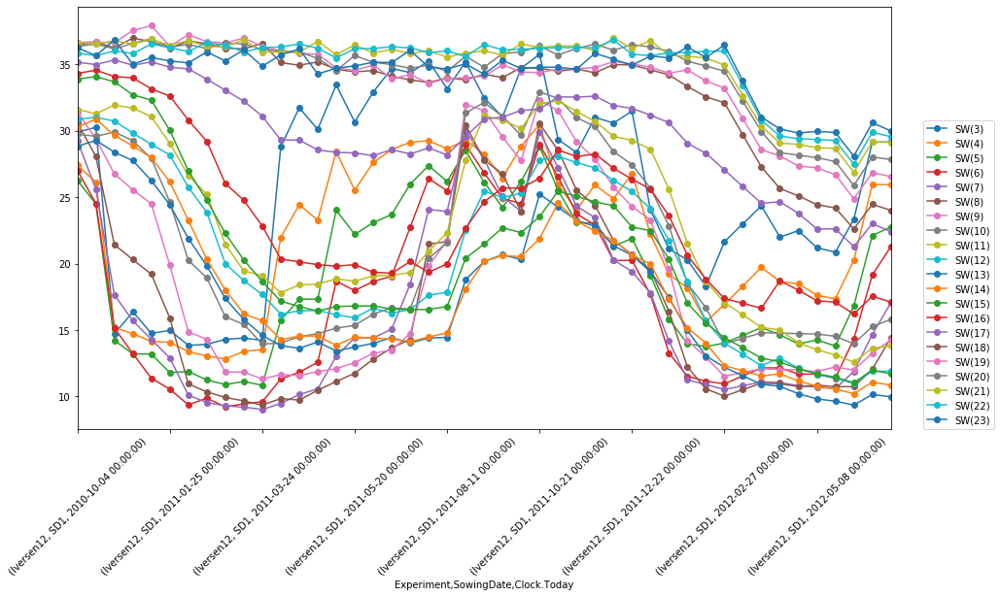

In [8]:
idx = pd.IndexSlice
water_mean.loc[idx["Iversen12","SD1",:],
          [X for X in water_mean.columns if X in ( 'SW(3)', 'SW(4)', 'SW(5)', 'SW(6)', 'SW(7)', 'SW(8)',
       'SW(9)', 'SW(10)', 'SW(11)', 'SW(12)', 'SW(13)', 'SW(14)', 'SW(15)',
       'SW(16)', 'SW(17)', 'SW(18)', 'SW(19)', 'SW(20)', 'SW(21)', 'SW(22)',
       'SW(23)')]].\
plot(figsize=(15, 8),style='o-')
plt.xticks( rotation=45)
plt.legend(loc=(1.04,0))

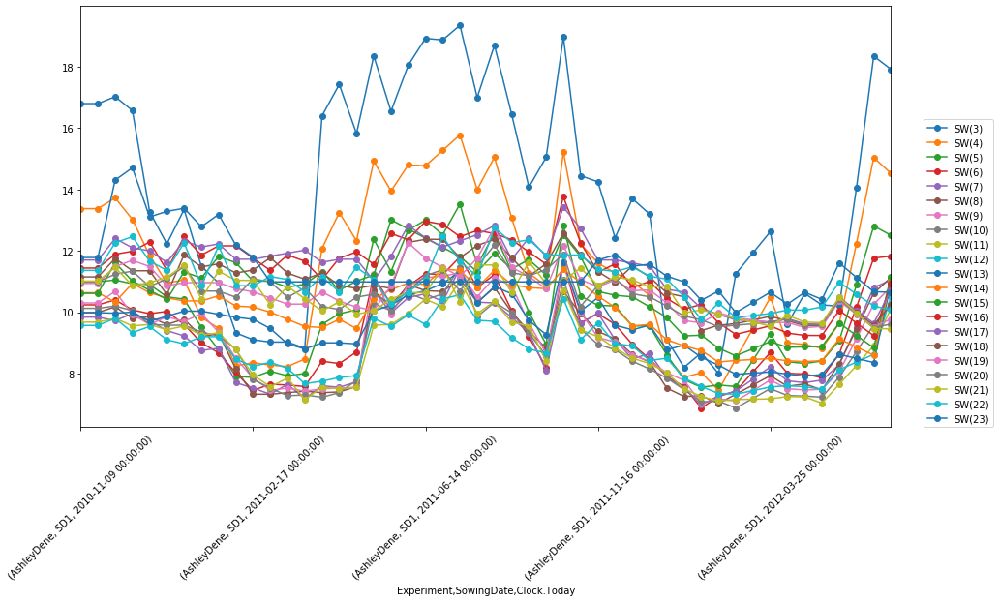

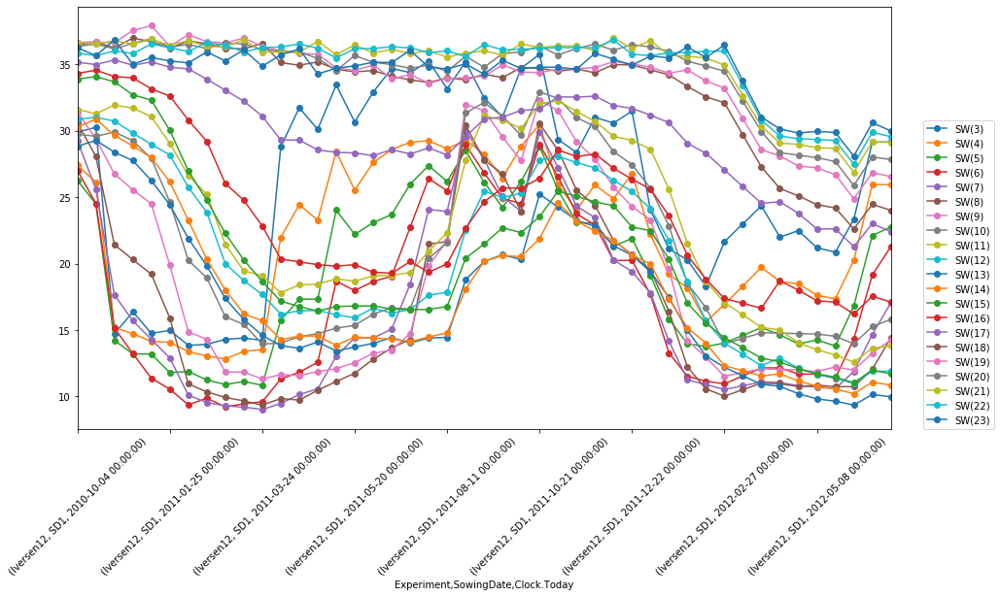

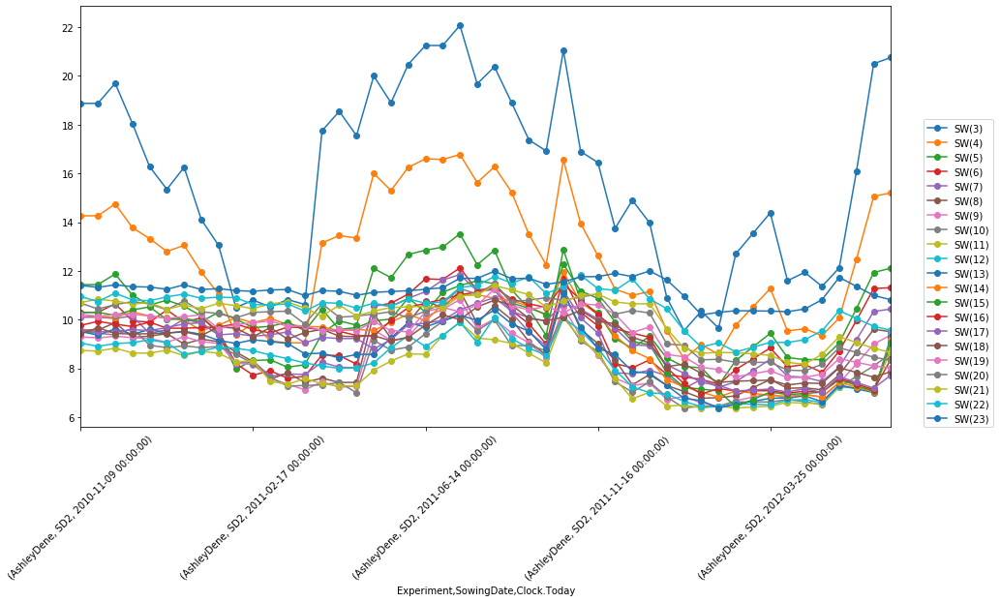

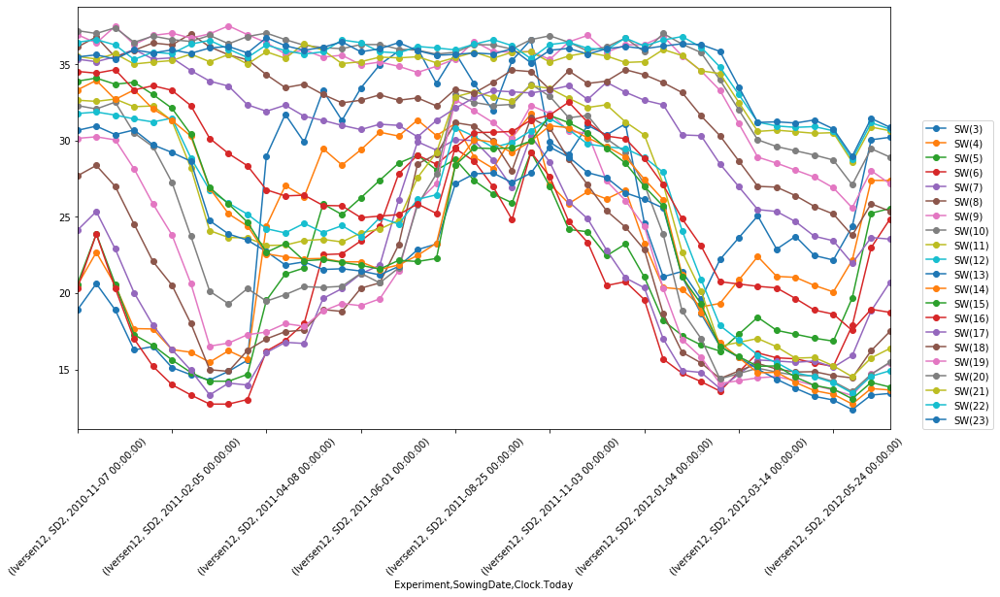

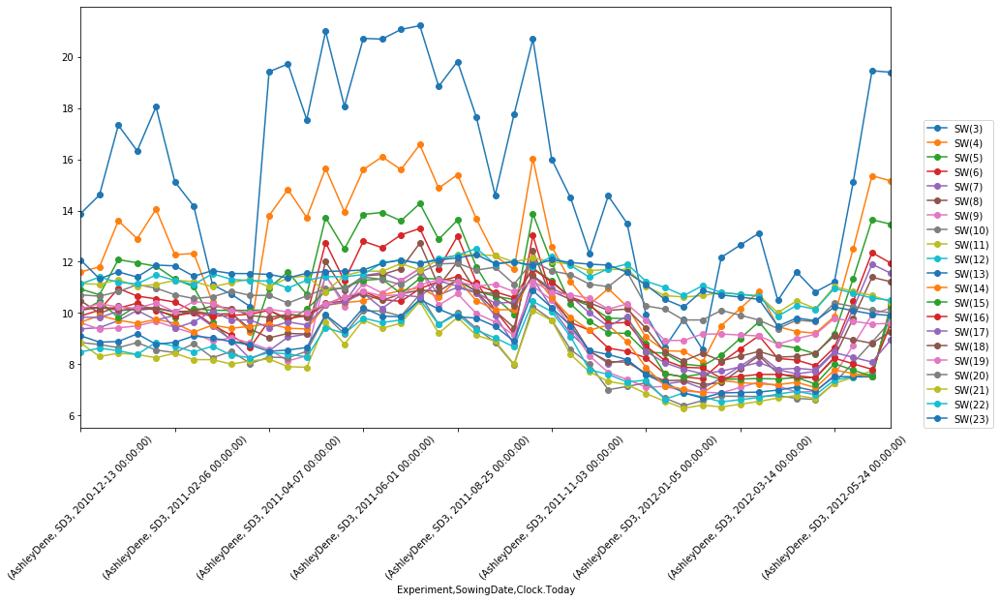

...

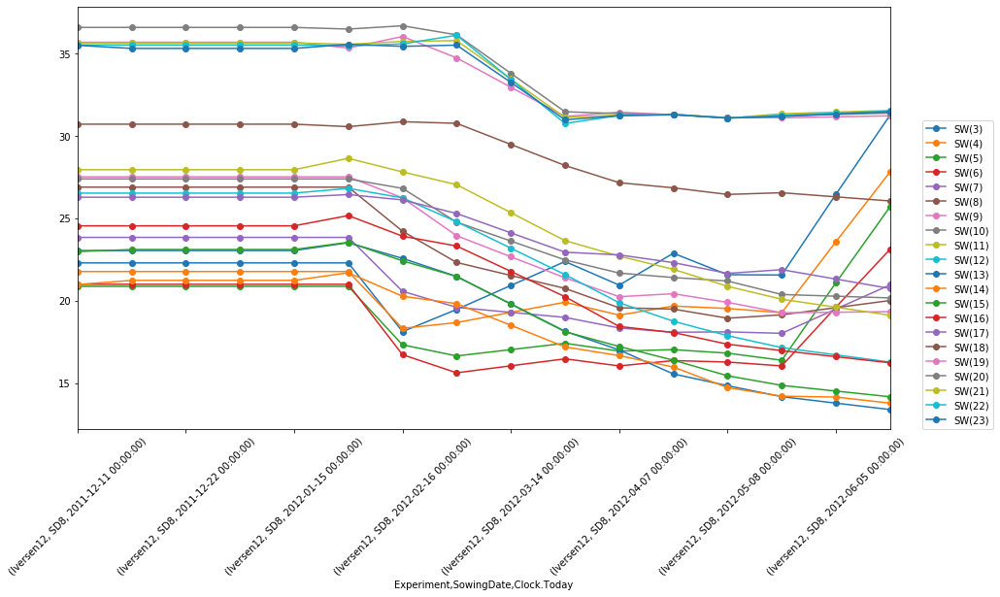

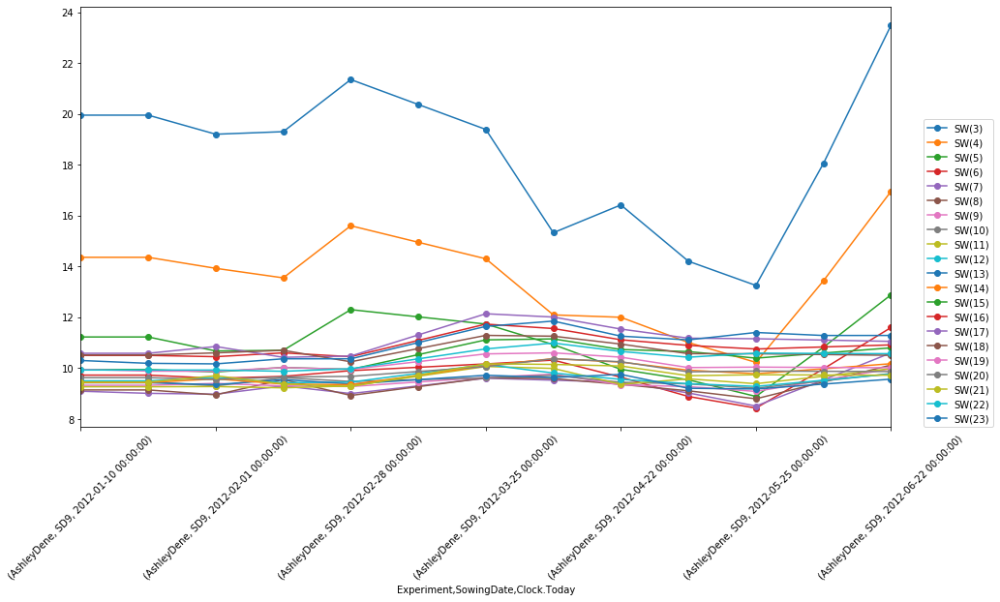

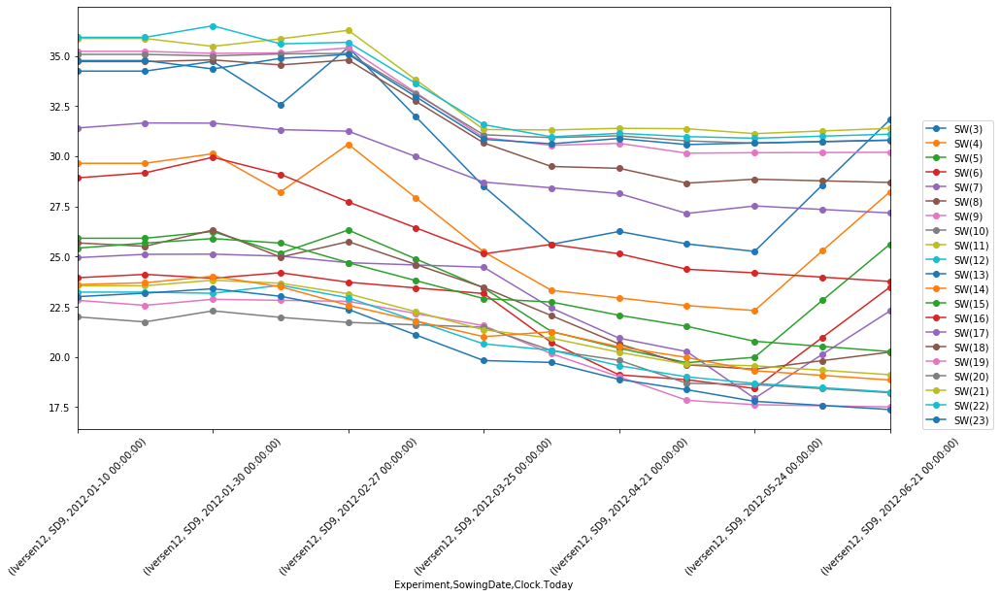

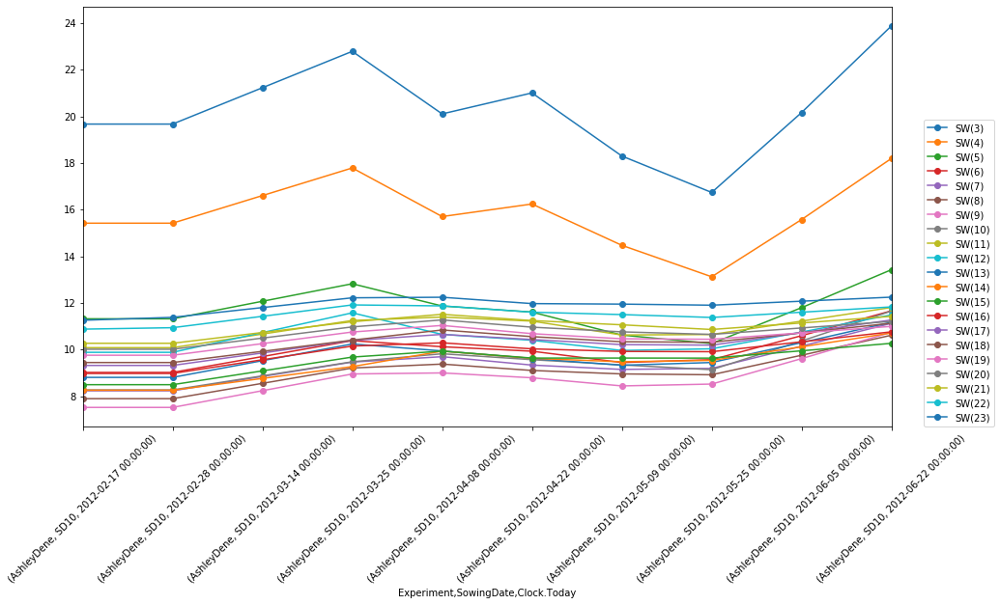

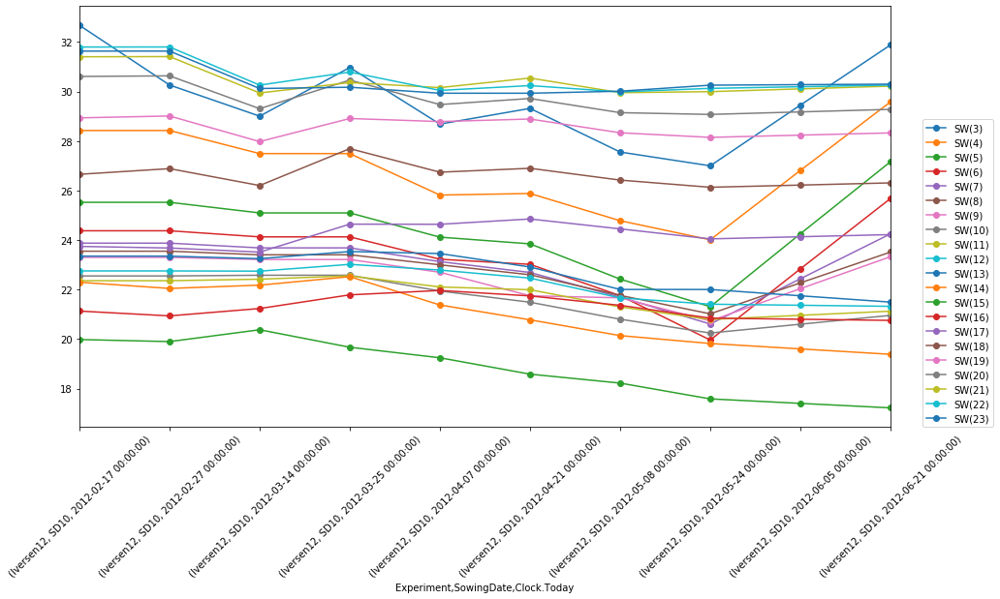

In [9]:
SDs = ['SD' + str(SD) for SD in range(1, 11)]
Sites = ['AshleyDene', 'Iversen12']
for i in SDs:
    for j in Sites:
        idx = pd.IndexSlice
        water_mean.loc[idx[j,i,:],
          [X for X in water_mean.columns if X in ( 'SW(3)', 'SW(4)', 'SW(5)', 'SW(6)', 'SW(7)', 'SW(8)',
       'SW(9)', 'SW(10)', 'SW(11)', 'SW(12)', 'SW(13)', 'SW(14)', 'SW(15)',
       'SW(16)', 'SW(17)', 'SW(18)', 'SW(19)', 'SW(20)', 'SW(21)', 'SW(22)',
       'SW(23)')]].\
        plot(figsize=(15, 8),style='o-')
        plt.xticks( rotation=45)
        plt.legend(loc=(1.04,0))

### Sowing date 9 and 10 are not really useful 

In [10]:
cols = ['SW(' + str(layer) + ')' for layer in range(1, 24)]

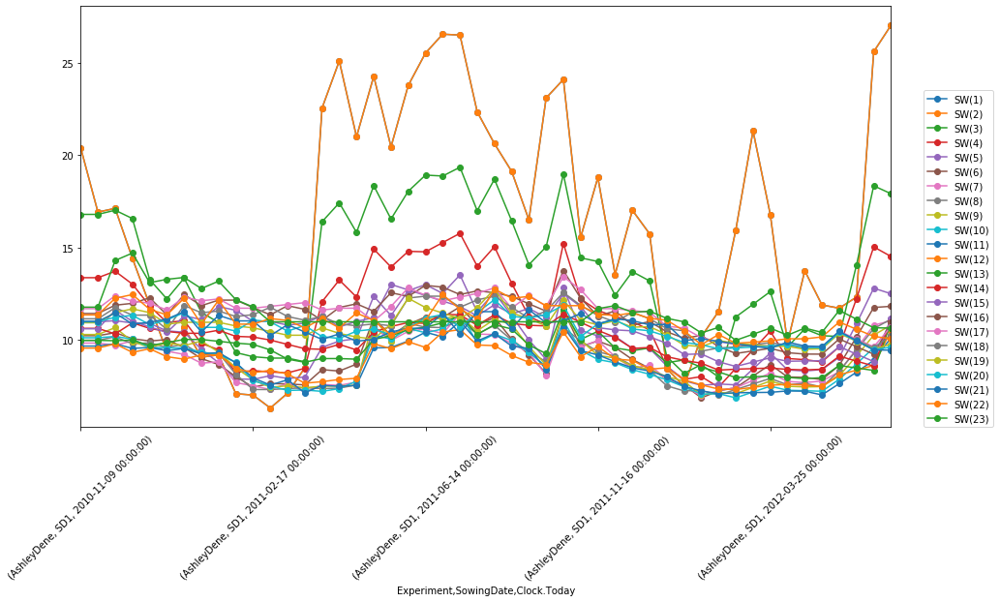

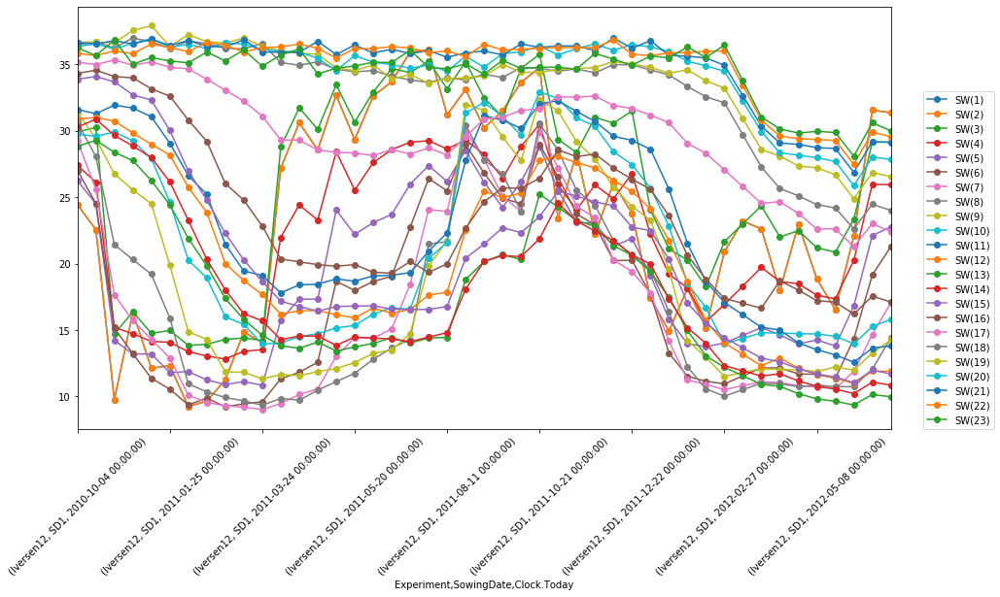

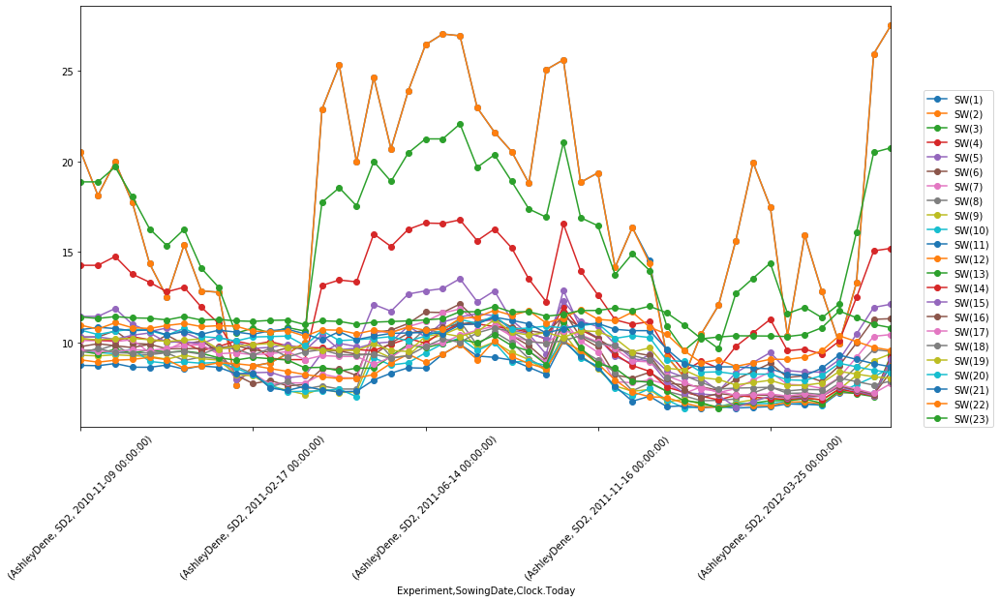

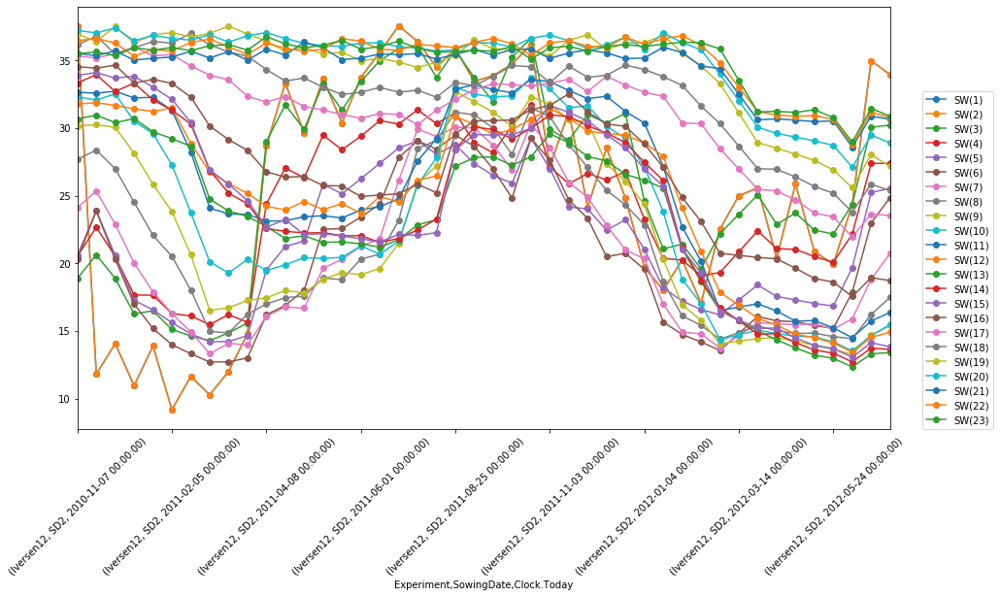

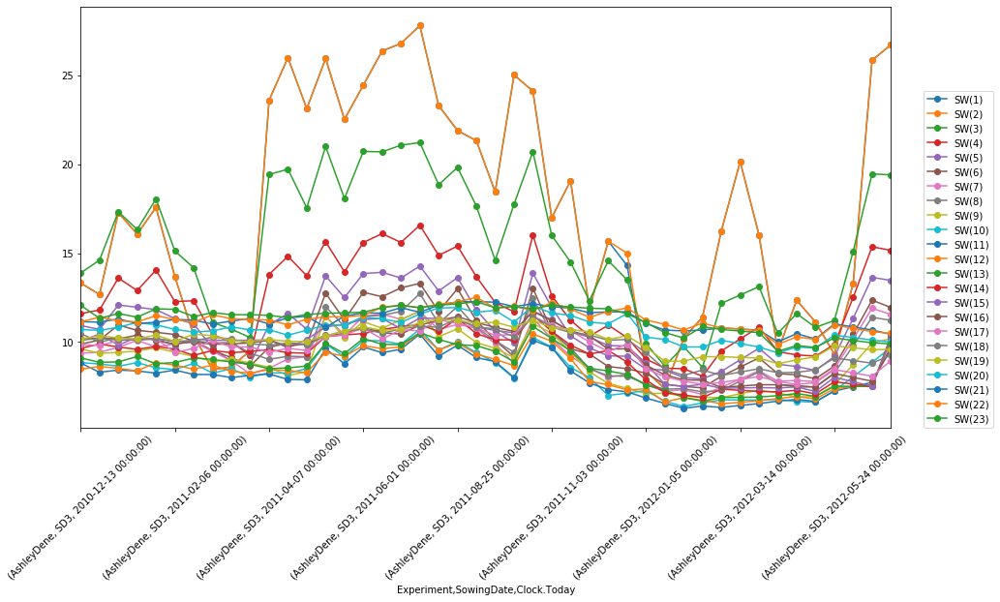

...

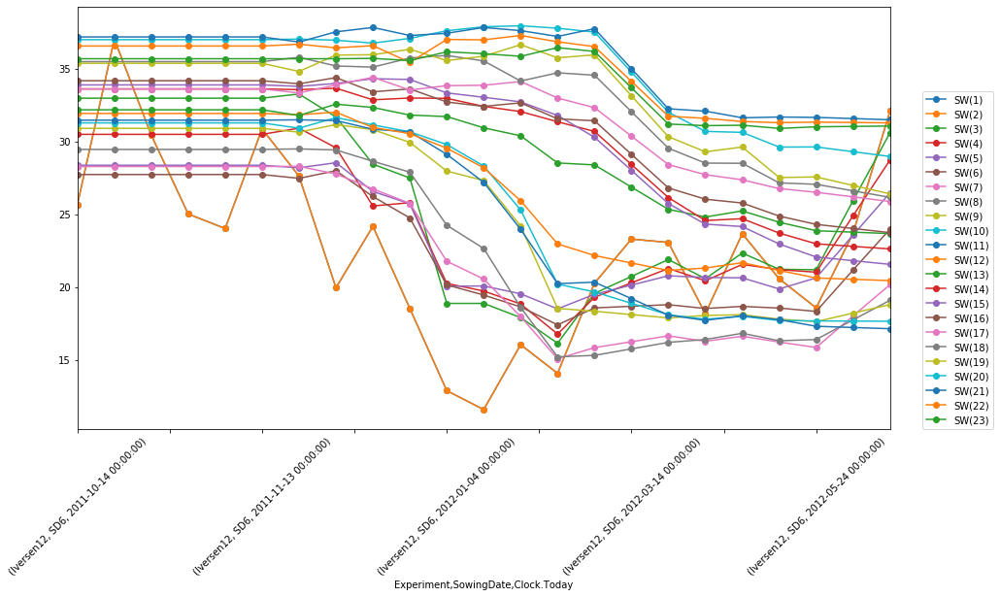

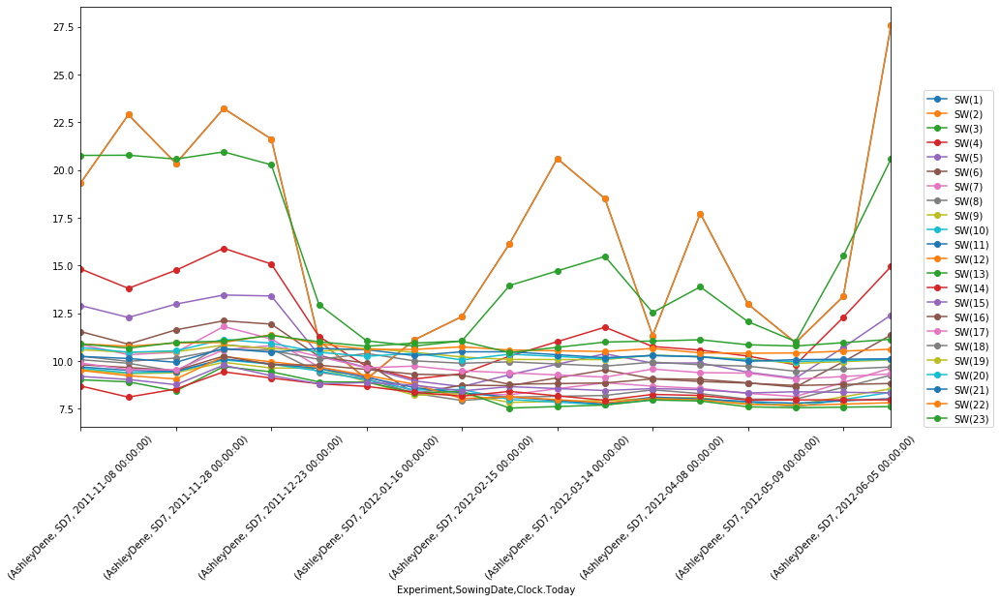

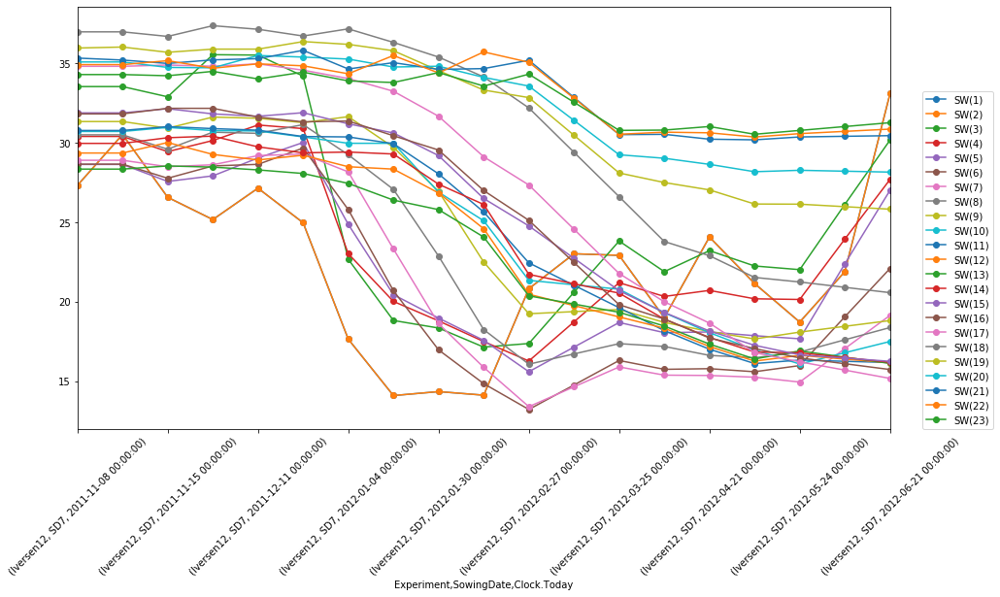

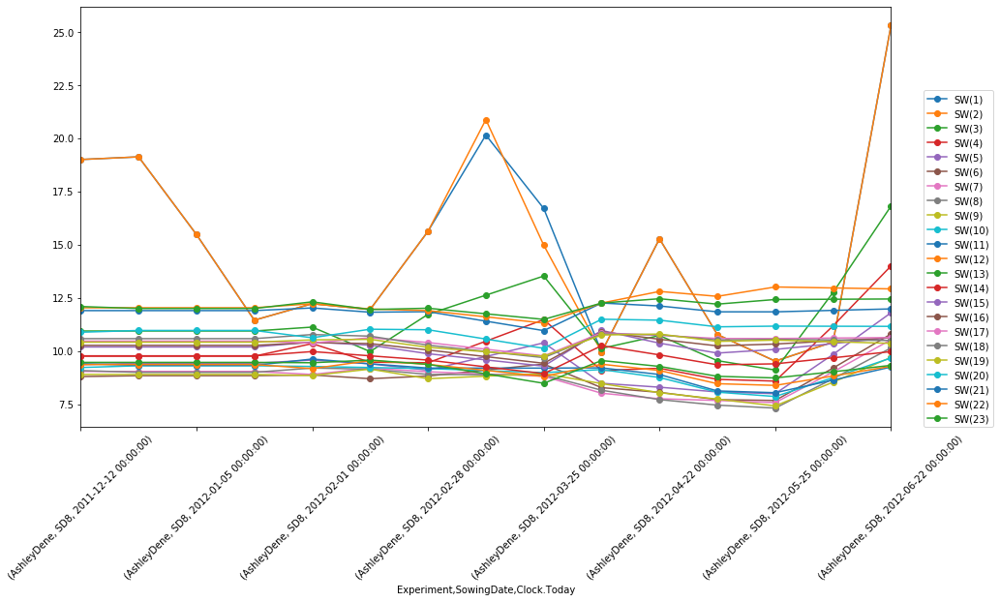

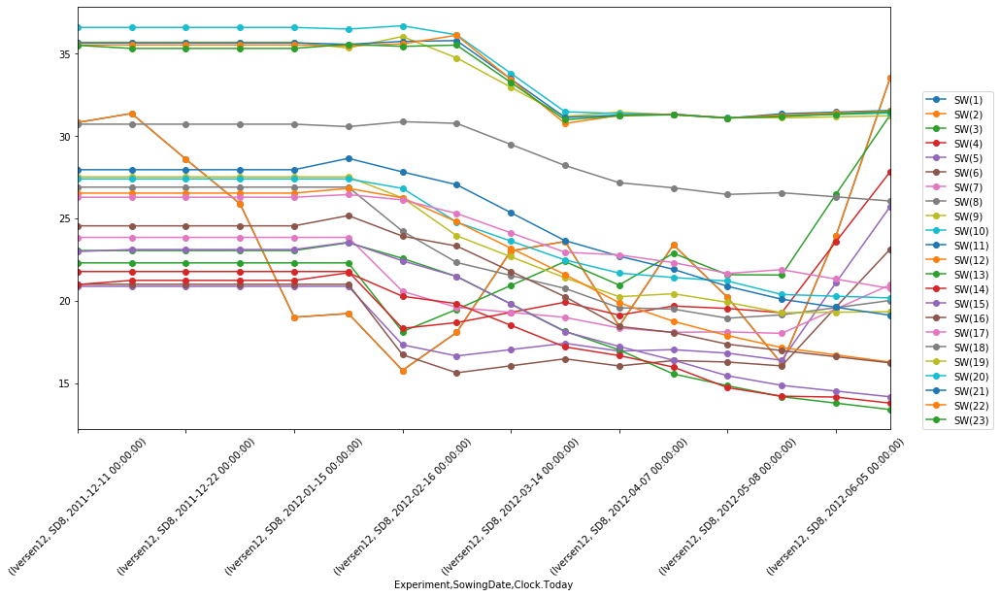

In [11]:
SDs = ['SD' + str(SD) for SD in range(1, 9)]
Sites = ['AshleyDene', 'Iversen12']
for i in SDs:
    for j in Sites:
        idx = pd.IndexSlice
        water_mean.loc[idx[j,i,:],
          [X for X in cols]].\
        plot(figsize=(15, 8),style='o-')
        plt.xticks( rotation=45)
        plt.legend(loc=(1.04,0))

### Group then found out the DUL and LL

In [12]:
DUL = water_mean.groupby(['Experiment','SowingDate']).apply(max)

In [13]:
DUL.head()

Rep   Plot    DAS   SW(1)   SW(2)      SW(3)  \
Experiment SowingDate                                                 
AshleyDene SD1         2.5  40.75  630.0  27.025  27.025  19.350000   
           SD10        2.5  98.50  610.0  28.425  28.425  23.882791   
           SD2         2.5  42.50  611.0  27.525  27.525  22.075000   
           SD3         2.5  40.00  582.0  27.800  27.800  21.225000   
           SD4         2.5  40.00  546.0  30.000  30.000  24.275000   

                           SW(4)      SW(5)      SW(6)      SW(7)  ...  \
Experiment SowingDate                                              ...   
AshleyDene SD1         15.775000  13.525000  11.826762  11.425000  ...   
           SD10        18.199897  13.430111  11.666624  11.132802  ...   
           SD2         16.775000  13.525000  12.125000  11.850000  ...   
           SD3         16.575000  14.275000  13.300000  11.906675  ...   
           SD4         18.125000  15.125000  12.925000  11.950000  ...   

                          SW(15)     SW(16)     SW(17)     SW(18)     SW(19)  \
Experiment SowingDate                                                          
AshleyDene SD1         13.012500  13.762500  13.425000  12.575000  12.762500   
           SD10        10.272979  10.765964  11.275068  11.135722  11.040135   
           SD2         12.275000  11.450000  10.900000  10.800000  11.250000   
           SD3         11.750000  11.725000  11.450000  11.441667  11.297222   
           SD4         11.662500  11.579167  11.995833  12.225000  12.325000   

                          SW(20)     SW(21)     SW(22)     SW(23)         SWC  
Experiment SowingDate                                                          
AshleyDene SD1         12.187500  11.637500  12.762500  14.706250  306.204167  
           SD10        11.276559  11.517049  11.919983  12.253568  314.575825  
           SD2         11.475000  11.400000  11.825000  12.000000  301.900000  
           SD3         12.026852  12.276543  12.521039  12.278361  312.406222  
           SD4         12.200000  11.666760  11.740636  11.820956  322.095833  

[5 rows x 27 columns]

In [14]:
water_mean.head()

Rep   Plot   DAS   SW(1)   SW(2)   SW(3)  \
Experiment SowingDate Clock.Today                                             
AshleyDene SD1        2010-11-09   2.5  40.75  19.0  20.400  20.400  16.800   
                      2010-11-16   2.5  40.75  26.0  16.925  16.925  16.800   
                      2010-11-24   2.5  40.75  34.0  17.125  17.125  17.025   
                      2010-12-02   2.5  40.75  42.0  14.425  14.425  16.575   
                      2010-12-13   2.5  40.75  53.0  11.900  11.900  13.275   

                                    SW(4)    SW(5)    SW(6)   SW(7)  ...  \
Experiment SowingDate Clock.Today                                    ...   
AshleyDene SD1        2010-11-09   13.375  10.9875  10.2375  9.8375  ...   
                      2010-11-16   13.375  10.9875  10.2375  9.8375  ...   
                      2010-11-24   13.725  11.0500  10.4000  9.7250  ...   
                      2010-12-02   13.025  10.9250  10.0750  9.9500  ...   
                      2010-12-13   11.850  10.9000   9.9500  9.7250  ...   

                                    SW(15)   SW(16)  SW(17)  SW(18)   SW(19)  \
Experiment SowingDate Clock.Today                                              
AshleyDene SD1        2010-11-09   10.6125  11.4375    11.7   11.15  10.9375   
                      2010-11-16   10.6125  11.4375    11.7   11.15  10.9375   
                      2010-11-24   11.6125  11.8875    12.4   11.75  11.4875   
                      2010-12-02   11.0125  11.9875    12.1   11.35  11.6875   
                      2010-12-13   10.7125  12.2875    12.0   11.35  11.4875   

                                    SW(20)   SW(21)   SW(22)    SW(23)  \
Experiment SowingDate Clock.Today                                        
AshleyDene SD1        2010-11-09   10.9875  11.0125  11.3625  11.78125   
                      2010-11-16   10.9875  11.0125  11.3625  11.78125   
                      2010-11-24   11.2375  11.4625  12.2625  14.30625   
                      2010-12-02   11.3375  10.8625  12.4625  14.70625   
                      2010-12-13   10.8375  10.9625  11.6625  13.10625   

                                          SWC  
Experiment SowingDate Clock.Today              
AshleyDene SD1        2010-11-09   273.289583  
                      2010-11-16   266.339583  
                      2010-11-24   275.531250  
                      2010-12-02   266.497917  
                      2010-12-13   252.422917  

[5 rows x 27 columns]

In [15]:
water_meanLONG = water_mean.reset_index().melt(id_vars= ['Experiment','SowingDate','Clock.Today'], value_vars=cols)
DUL_LONG = DUL.reset_index().melt(id_vars= ['Experiment','SowingDate'], value_vars=cols)

In [16]:
relativeSW = water_meanLONG.merge(DUL_LONG, left_on=['Experiment','SowingDate','variable'],
                                  right_on=['Experiment','SowingDate', 'variable'])

In [17]:
relativeSW['relativeSW'] = relativeSW['value_x'] / relativeSW['value_y']

In [18]:
df = relativeSW.pivot_table(values='relativeSW', index=['Experiment','SowingDate', 'Clock.Today'], 
                       columns='variable')

In [19]:
df.columns
df

variable                              SW(1)    SW(10)    SW(11)    SW(12)  \
Experiment SowingDate Clock.Today                                           
AshleyDene SD1        2010-11-09   0.754857  0.882353  0.877551  0.905363   
                      2010-11-16   0.626272  0.882353  0.877551  0.905363   
                      2010-11-24   0.633673  0.888889  0.888889  0.927445   
                      2010-12-02   0.533765  0.875817  0.866213  0.883281   
                      2010-12-13   0.440333  0.836601  0.870748  0.902208   
...                                     ...       ...       ...       ...   
Iversen12  SD9        2012-04-21   0.743777  0.889562  0.849352  0.830054   
                      2012-05-08   0.613470  0.838206  0.824196  0.806393   
                      2012-05-24   0.565154  0.835370  0.821179  0.792638   
                      2012-06-05   0.757687  0.826280  0.811815  0.783537   
                      2012-06-21   1.000000  0.817183  0.802439  0.774428   

variable                             SW(13)    SW(14)    SW(15)    SW(16)  \
Experiment SowingDate Clock.Today                                           
AshleyDene SD1        2010-11-09   0.858166  0.932749  0.815562  0.831063   
                      2010-11-16   0.858166  0.932749  0.815562  0.831063   
                      2010-11-24   0.856734  0.906433  0.892411  0.863760   
                      2010-12-02   0.859599  0.959064  0.846302  0.871026   
                      2010-12-13   0.833811  0.932749  0.823247  0.892825   
...                                     ...       ...       ...       ...   
Iversen12  SD9        2012-04-21   0.807119  0.853641  0.852568  0.839500   
                      2012-05-08   0.785141  0.831508  0.831281  0.813733   
                      2012-05-24   0.760414  0.804025  0.802497  0.807774   
                      2012-06-05   0.751658  0.794439  0.792591  0.800619   
                      2012-06-21   0.742894  0.784841  0.782667  0.793456   

variable                             SW(17)    SW(18)  ...    SW(21)  \
Experiment SowingDate Clock.Today                      ...             
AshleyDene SD1        2010-11-09   0.871508  0.886680  ...  0.946294   
                      2010-11-16   0.871508  0.886680  ...  0.946294   
                      2010-11-24   0.923650  0.934394  ...  0.984962   
                      2010-12-02   0.901304  0.902584  ...  0.933405   
                      2010-12-13   0.893855  0.902584  ...  0.941998   
...                                     ...       ...  ...       ...   
Iversen12  SD9        2012-04-21   0.888924  0.844827  ...  0.865387   
                      2012-05-08   0.857643  0.823641  ...  0.864841   
                      2012-05-24   0.869438  0.829246  ...  0.858074   
                      2012-06-05   0.863938  0.826917  ...  0.861732   
                      2012-06-21   0.858429  0.824583  ...  0.865384   

variable                             SW(22)    SW(23)     SW(3)     SW(4)  \
Experiment SowingDate Clock.Today                                           
AshleyDene SD1        2010-11-09   0.890304  0.801105  0.868217  0.847861   
                      2010-11-16   0.890304  0.801105  0.868217  0.847861   
                      2010-11-24   0.960823  0.972801  0.879845  0.870048   
                      2010-12-02   0.976494  1.000000  0.856589  0.825674   
                      2010-12-13   0.913810  0.891203  0.686047  0.751189   
...                                     ...       ...       ...       ...   
Iversen12  SD9        2012-04-21   0.853201  0.880576  0.741134  0.749745   
                      2012-05-08   0.848769  0.871912  0.723617  0.737411   
                      2012-05-24   0.846506  0.874207  0.713074  0.729233   
                      2012-06-05   0.849307  0.876246  0.806305  0.826501   
                      2012-06-21   0.852104  0.878281  0.898317  0.922646   

variable                              SW(5)     SW(6)    

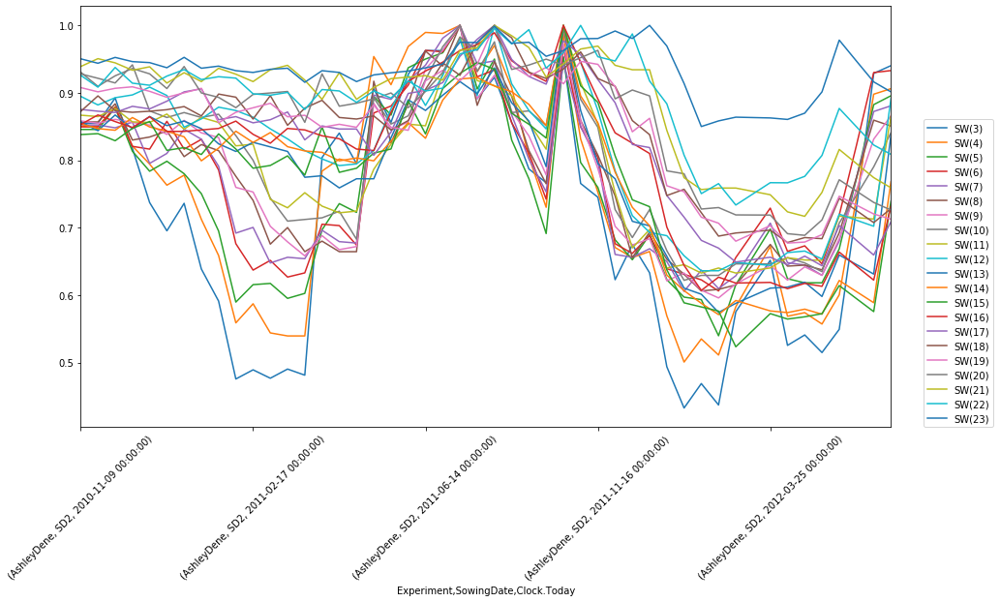

In [20]:
idx = pd.IndexSlice
df.loc[idx['AshleyDene','SD2',:],
               [X for X in cols[2:]]].\
plot(figsize=(15, 8),style='-')
plt.xticks( rotation=45)
plt.legend(loc=(1.04,0))

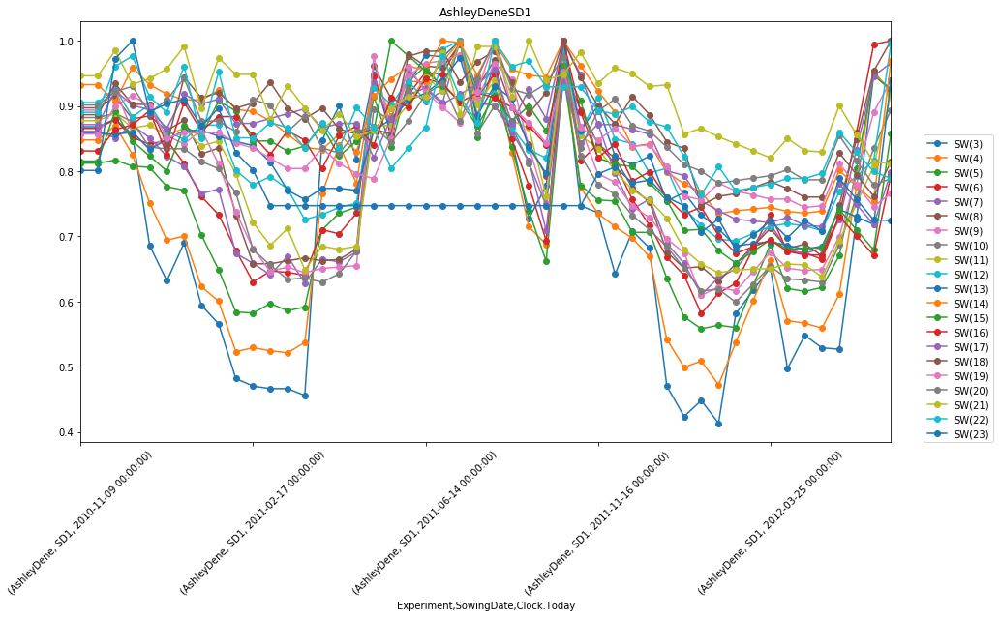

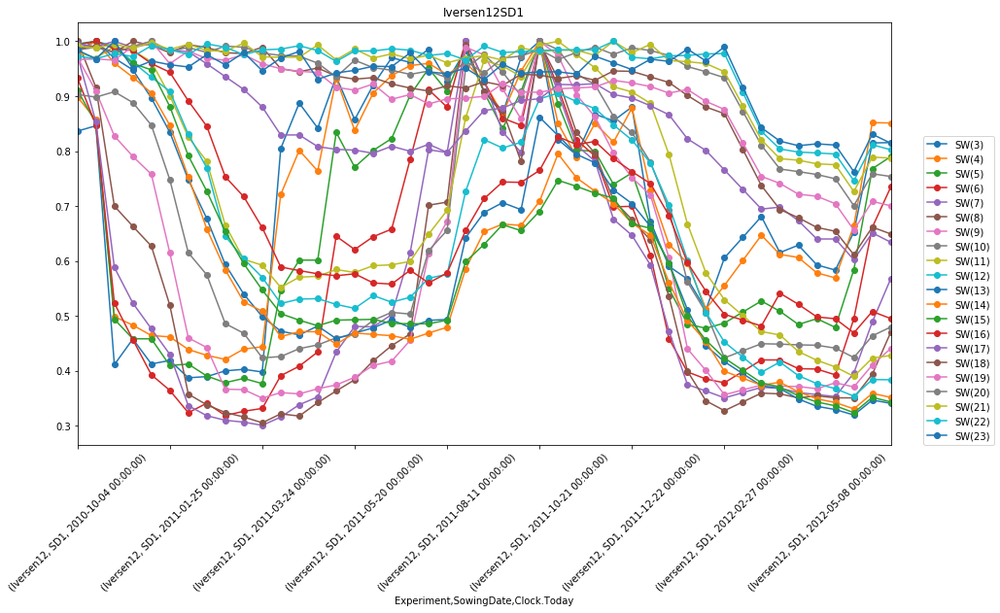

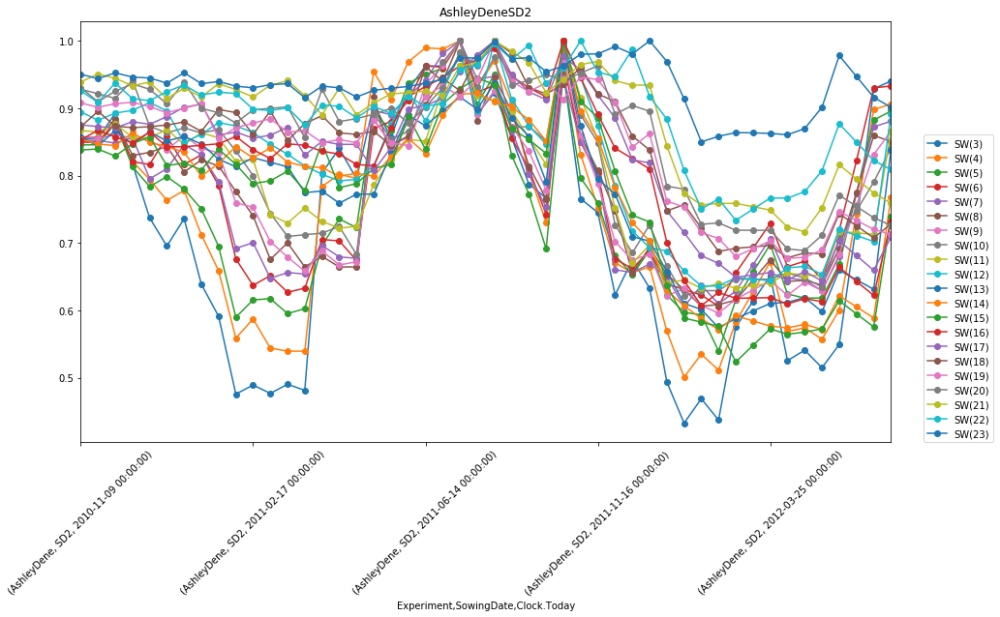

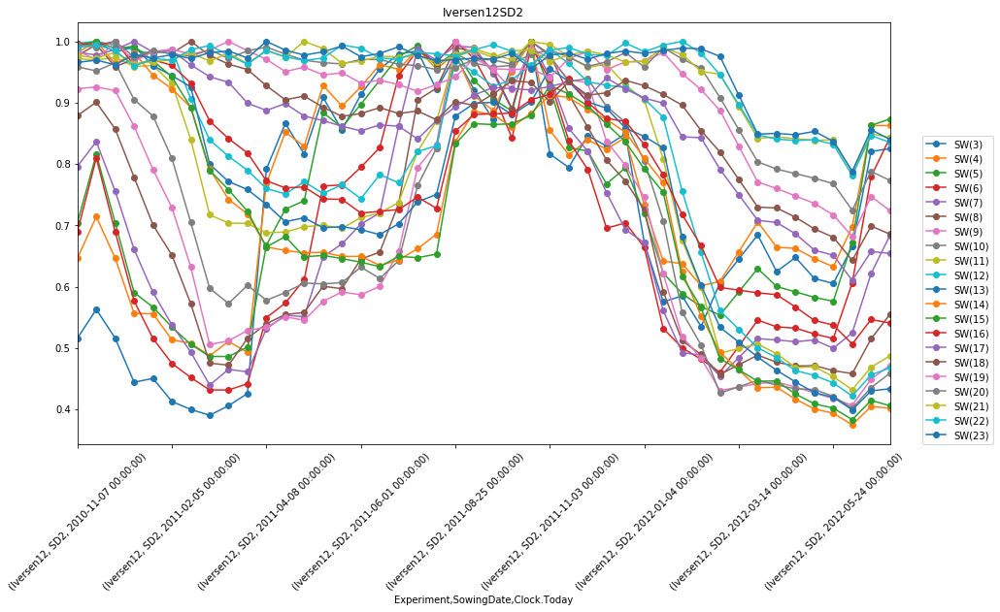

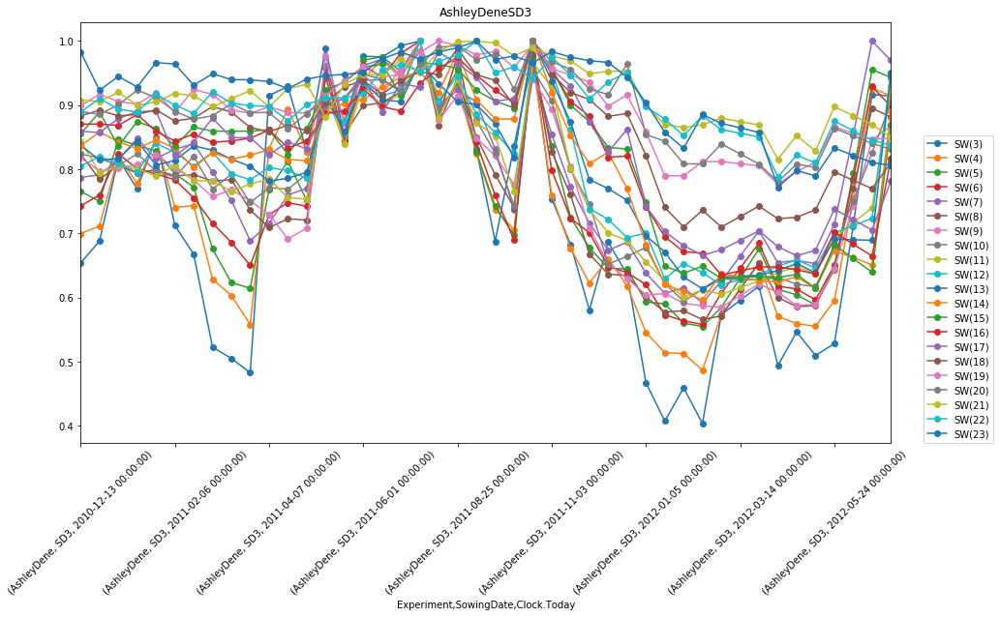

...

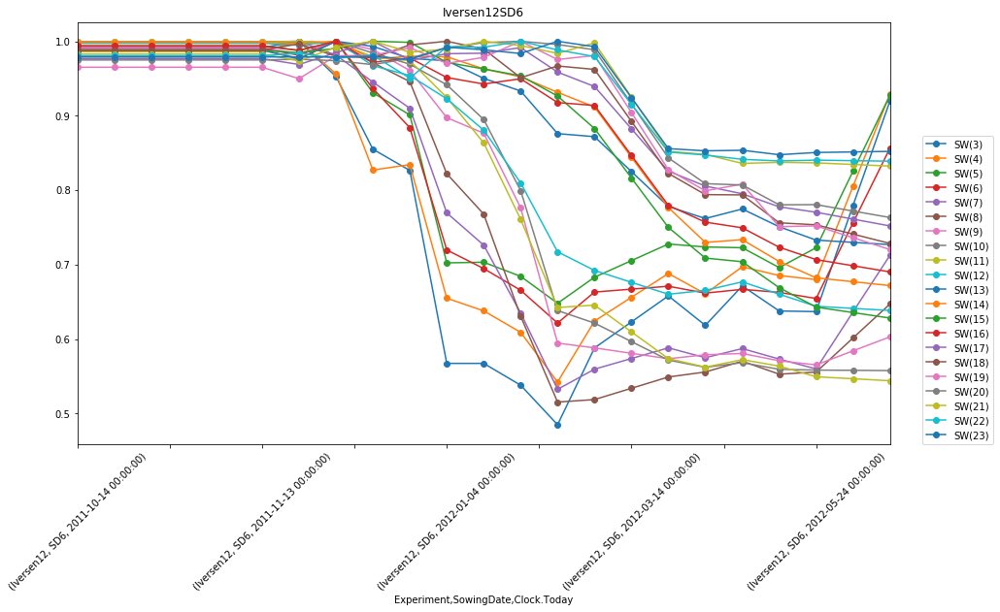

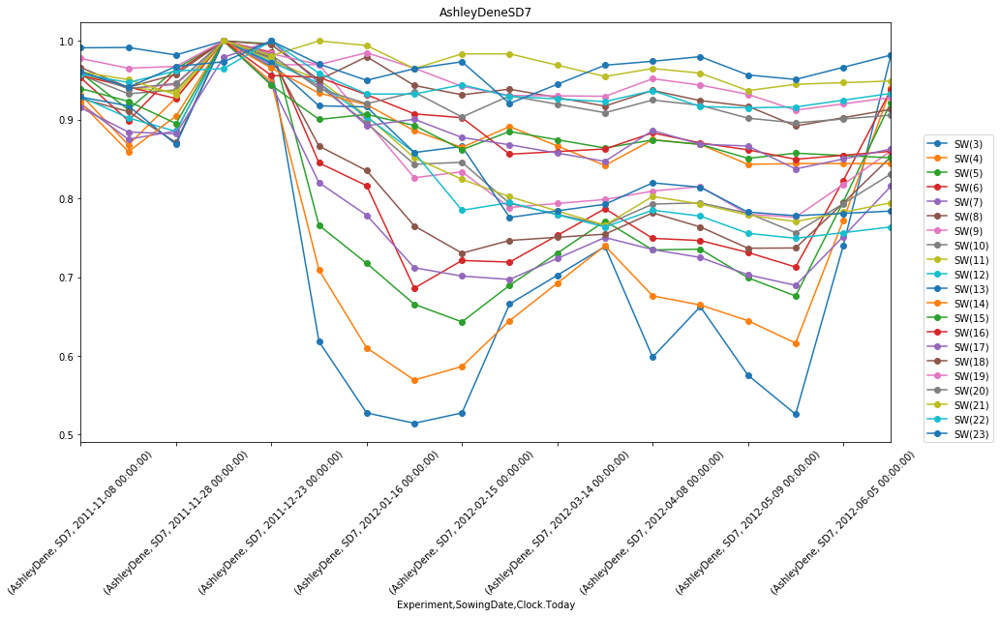

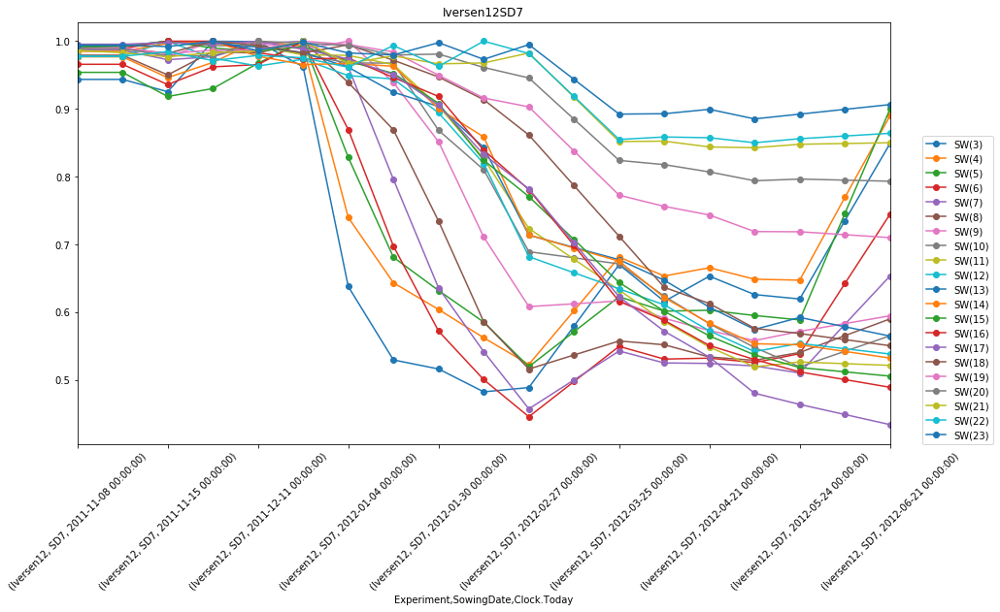

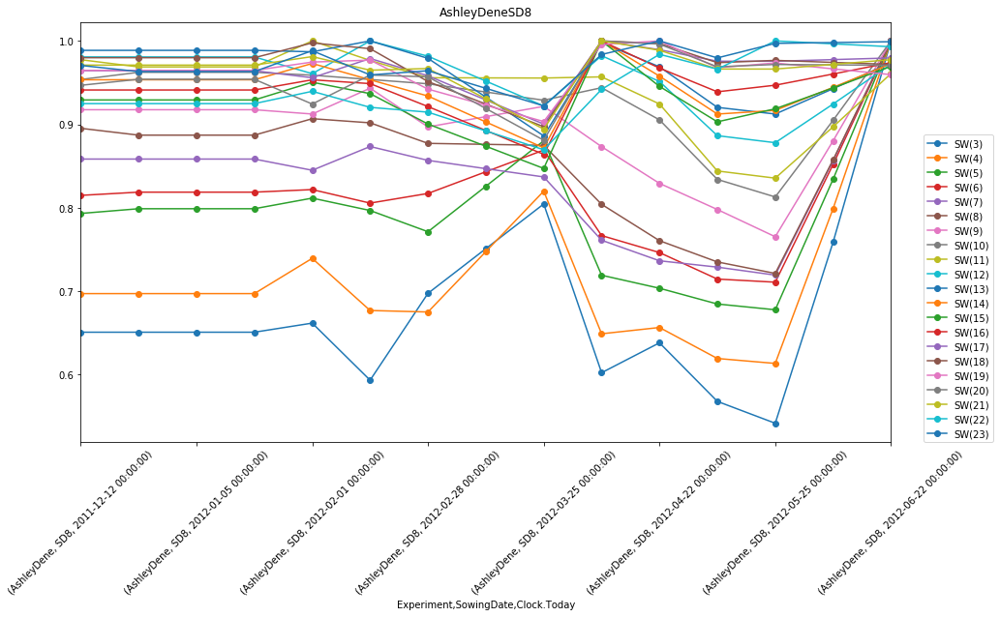

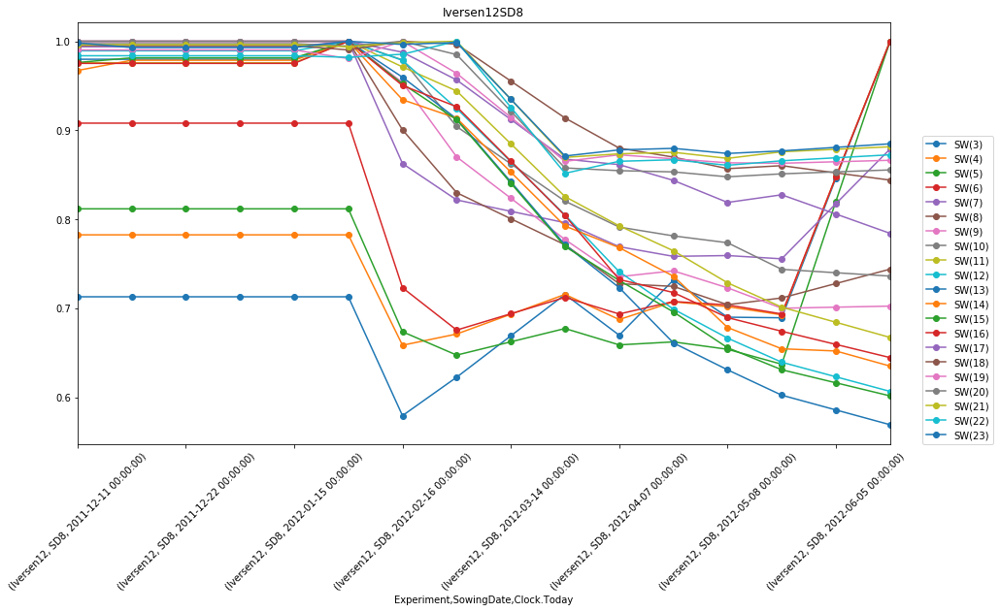

In [21]:
SDs = ['SD' + str(SD) for SD in range(1, 9)]
Sites = ['AshleyDene', 'Iversen12']
for i in SDs:
    for j in Sites:

        idx = pd.IndexSlice
        df.loc[idx[j,i,:],
                       [X for X in cols[2:]]].\
        plot(figsize=(15, 8),style='-o')
        plt.xticks( rotation=45)
        plt.legend(loc=(1.04,0)) 
        plt.title(j + i)

## How can I implement a 5% changes detection?

In [ ]:
idx = pd.IndexSlice
test = df.loc[idx['AshleyDene','SD2',:],['SW(3)','SW(4)','SW(5)', 'SW(6)', 'SW(7)','SW(8)']]
test

In [ ]:
# test['delta'] = test['SW(3)'] -test['shift']

# test['RFVFront'] = test['delta'] < -0.05
# test[test['delta'] < 0]

In [ ]:
test.plot(figsize=(15, 8),style='o-')
plt.xticks( rotation=45)

## How many days after sown 

In [27]:
sowingdates = pd.read_sql('Select * from SowingDates',  con)
sowingdates.AD = pd.to_datetime(sowingdates.AD)
sowingdates.I12 = pd.to_datetime(sowingdates.I12)
# set index and rename columns 
# sowingdates.set_index('SD', inplace=True)
sowingdates.columns = ['SowingDate','AshleyDene', 'Iversen12']

In [ ]:
df
# sowingdates

In [29]:
sowingdates_melted = sowingdates.melt(id_vars='SowingDate', var_name = 'Experiment', value_name='Clock.Today').\
set_index(['Experiment', 'SowingDate'])

In [30]:
sowingdates_melted
df_reindexed = df.reset_index().set_index(['Experiment', 'SowingDate'])

In [38]:
# check if merge happened
df_SD = df_reindexed.merge(sowingdates_melted, 
                           left_index=True, right_index=True, how='outer', suffixes= ("","Start"))
# df_SD = df_SD.reset_index().set_index(['Experiment', 'SowingDate'])


In [39]:
df_SD['DAS']  = (df_SD['Clock.Today'] - df_SD['Clock.TodayStart']).map(lambda x: x.days)
df_SD[['DAS']]


DAS
Experiment SowingDate     
AshleyDene SD1          19
           SD1          26
           SD1          34
           SD1          42
           SD1          53
...                    ...
Iversen12  SD9         102
           SD9         119
           SD9         135
           SD9         147
           SD9         163

[586 rows x 1 columns]

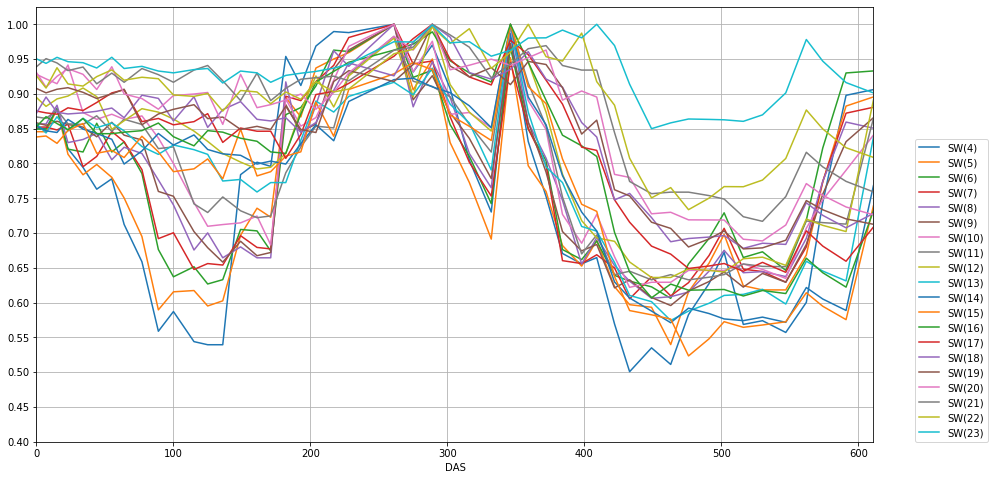

In [33]:
df_SD.loc['AshleyDene','SD2'].reset_index().\
set_index('DAS').loc[:, [x for x in cols[3:]]].\
plot(figsize=(15, 8),style='-', grid=True)
plt.yticks(np.arange(0.4, 1.05, 0.05))
plt.legend(loc = (1.05,0))

In [49]:
long = df_SD.drop(columns = 'Clock.TodayStart').reset_index().\
melt(id_vars= ['Experiment','SowingDate','Clock.Today','DAS'], 
     value_vars=cols, var_name='layer', value_name='relSW')
long['delta'] = long['relSW'] - long['relSW'].shift(1)
long

,Experiment,SowingDate,Clock.Today,DAS,layer,relSW,delta
0,AshleyDene,SD1,2010-11-09,19,SW(1),0.754857,NaN
1,AshleyDene,SD1,2010-11-16,26,SW(1),0.626272,-0.128585
2,AshleyDene,SD1,2010-11-24,34,SW(1),0.633673,0.007401
3,AshleyDene,SD1,2010-12-02,42,SW(1),0.533765,-0.099907
4,AshleyDene,SD1,2010-12-13,53,SW(1),0.440333,-0.093432
...,...,...,...,...,...,...,...
13473,Iversen12,SD9,2012-04-21,102,SW(23),0.880576,0.007534
13474,Iversen12,SD9,2012-05-08,119,SW(23),0.871912,-0.008664
13475,Iversen12,SD9,2012-05-24,135,SW(23),0.874207,0.002295
13476,Iversen12,SD9,2012-06-05,147,SW(23),0.876246,0.002038


In [36]:
LONG = df_SD.stack(dropna=False).to_frame(name = 'relSW').\
reset_index().set_index(['Experiment', 'SowingDate', 'level_3','Clock.Today']).\
sort_values(['Experiment','SowingDate','level_3','Clock.Today'])

# LONG['delta'] = LONG['relSW'] - LONG['relSW'].shift(1)
# test = LONG[(LONG['delta'] < -0.05) |( np.isnan(LONG['delta']))]
# pivot_table(values=['relSW','delta'], 
#             index=['Experiment','SowingDate', 'Clock.Today'], 
#             columns = ['level_3'])
# test
LONG

relSW
Experiment SowingDate level_3     Clock.Today                     
AshleyDene SD1        Clock.Today 2010-11-09   2010-10-21 00:00:00
                                  2010-11-16   2010-10-21 00:00:00
                                  2010-11-24   2010-10-21 00:00:00
                                  2010-12-02   2010-10-21 00:00:00
                                  2010-12-13   2010-10-21 00:00:00
...                                                            ...
Iversen12  SD9        SW(9)       2012-04-21              0.831294
                                  2012-05-08               0.78005
                                  2012-05-24              0.770599
                                  2012-06-05              0.768157
                                  2012-06-21              0.765678

[14064 rows x 1 columns]

## I need a water balance 

$SoilWaterExtraction = min(Transpiration supply, Demand)$

$Demand = PET$

$Soil evaporation = first layer water usage * (1 - canopy cover)$

In [52]:
water_mean.drop(columns=['Rep', 'Plot']).reset_index()

,Experiment,SowingDate,Clock.Today,DAS,SW(1),SW(2),SW(3),SW(4),SW(5),SW(6),...,SW(15),SW(16),SW(17),SW(18),SW(19),SW(20),SW(21),SW(22),SW(23),SWC
0,AshleyDene,SD1,2010-11-09,19.0,20.400,20.400,16.800000,13.375000,10.987500,10.237500,...,10.612500,11.437500,11.700000,11.150000,10.937500,10.987500,11.012500,11.362500,11.781250,273.289583
1,AshleyDene,SD1,2010-11-16,26.0,16.925,16.925,16.800000,13.375000,10.987500,10.237500,...,10.612500,11.437500,11.700000,11.150000,10.937500,10.987500,11.012500,11.362500,11.781250,266.339583
2,AshleyDene,SD1,2010-11-24,34.0,17.125,17.125,17.025000,13.725000,11.050000,10.400000,...,11.612500,11.887500,12.400000,11.750000,11.487500,11.237500,11.462500,12.262500,14.306250,275.531250
3,AshleyDene,SD1,2010-12-02,42.0,14.425,14.425,16.575000,13.025000,10.925000,10.075000,...,11.012500,11.987500,12.100000,11.350000,11.687500,11.337500,10.862500,12.462500,14.706250,266.497917
4,AshleyDene,SD1,2010-12-13,53.0,11.900,11.900,13.275000,11.850000,10.900000,9.950000,...,10.712500,12.287500,12.000000,11.350000,11.487500,10.837500,10.962500,11.662500,13.106250,252.422917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
581,Iversen12,SD9,2012-04-21,102.0,25.400,25.400,26.254657,22.942198,20.440130,19.109241,...,22.081516,25.143011,28.141839,29.399994,30.644095,31.019133,31.391911,31.141820,30.886187,559.036774
582,Iversen12,SD9,2012-05-08,119.0,20.950,20.950,25.634125,22.564773,19.718087,18.871185,...,21.530166,24.371296,27.151535,28.662716,30.155653,30.765534,31.372091,30.980052,30.582304,537.672484
583,Iversen12,SD9,2012-05-24,135.0,19.300,19.300,25.260629,22.314521,19.986812,18.433114,...,20.784680,24.192826,27.524950,28.857776,30.176539,30.653047,31.126650,30.897482,30.662819,528.425546
584,Iversen12,SD9,2012-06-05,147.0,25.875,25.875,28.563366,25.290939,22.821079,20.972857,...,20.528106,23.978534,27.350832,28.776708,30.186842,30.724779,31.259320,30.999695,30.734317,554.375823


In [ ]:
test.loc[idx['AshleyDene','SD2',:]].plot(figsize=(15, 8),style='o-')
plt.xticks( rotation=45)

In [ ]:
# df_SD = df.merge(sowingdates_melted, left_index=True, right_index=True, how='outer')
# test = df_SD.loc[idx['AshleyDene','SD1',:],['SW(3)','SW(4)','SW(5)', 'SW(6)', 'SW(7)',
#                                         'SW(8)', 'SW(9)','SW(10)', 'SW(11)', 'SW(12)',
#                                         'SW(13)','SW(14)', 'SW(15)', 'SW(16)','SW(17)','SW(18)']]
# test.plot(figsize=(15, 8),style='o-')
# plt.xticks( rotation=45)

## Read OPTIMISED RFV AND KL

In [ ]:
optimisedKLRFV = pd.read_excel("../../03processed-data/LayerByLayberRFVandKL.xlsx")
# optimisedKLRFV.set_index('names', inplace = True)

In [ ]:
optimisedKLRFV.axes

In [ ]:
idx = pd.IndexSlice

optimisedKLRFV.loc[idx["AshleyDeneSD2"],:].\
plot( 'KL', 'layer',figsize=(15, 8),style='-')
optimisedKLRFV.loc[idx["AshleyDeneSD3"],:].\
plot( 'KL', 'layer',figsize=(15, 8),style='-')
plt.legend()
plt.xlim(0, 0.15)